## THE BRIDGE (Data Science Bootcamp - Agosto 2020)
##  PROYECTO GRUPO D 
________________
### Análisis de datos asociados al COVID-19 del grupo de paises conformado por Portugal, Venezuela, Turquía, Reino Unido y España.

Fuente de datos (Data Set)  "https://covid.ourworldindata.org/data/owid-covid-data.csv"

Team members: 
- José Luis Manjon  presimanjon@yahoo.es        git @JoseLuisManjon
- Filipa Teles      filipa.teles@icloud.com     git 
- Mónica Villasuso  villasuso.monica@gmail.com  git @MVillasuso
_________________

Import de las librerías requeridas para el análisis

In [1]:
import pandas as pd 
import json 
import seaborn as sns
import numpy as np
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.express as px 
import plotly.io as pio
from datetime import datetime

Carga de datos en un dataframe de la fuente a utilizar

In [2]:
url = "https://covid.ourworldindata.org/data/owid-covid-data.csv"
covid_general = pd.read_csv(url, sep=",")
covid_general.head(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,ABW,North America,Aruba,2020-03-13,2.0,2.0,NaN,0.0,0.0,NaN,...,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29
1,ABW,North America,Aruba,2020-03-19,NaN,NaN,0.286,NaN,NaN,0.0,...,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29
2,ABW,North America,Aruba,2020-03-20,4.0,2.0,0.286,0.0,0.0,0.0,...,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29
3,ABW,North America,Aruba,2020-03-21,NaN,NaN,0.286,NaN,NaN,0.0,...,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29
4,ABW,North America,Aruba,2020-03-22,NaN,NaN,0.286,NaN,NaN,0.0,...,7.452,35973.781,NaN,NaN,11.62,NaN,NaN,NaN,NaN,76.29


Exploración de los datos del dataframe

In [3]:
covid_general.shape

(37628, 40)

In [4]:
covid_general.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37628 entries, 0 to 37627
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         37557 non-null  object 
 1   continent                        37326 non-null  object 
 2   location                         37628 non-null  object 
 3   date                             37628 non-null  object 
 4   total_cases                      37051 non-null  float64
 5   new_cases                        37051 non-null  float64
 6   new_cases_smoothed               36269 non-null  float64
 7   total_deaths                     37051 non-null  float64
 8   new_deaths                       37051 non-null  float64
 9   new_deaths_smoothed              36269 non-null  float64
 10  total_cases_per_million          36987 non-null  float64
 11  new_cases_per_million            36987 non-null  float64
 12  new_cases_smoothed

In [5]:
covid_general.index

RangeIndex(start=0, stop=37628, step=1)

In [6]:
# Revisión de los datos globales para ver si hay información totalizada (continent or country tienen valor  Null) y eliminarla posteriormente para el análisis
covid_general[(covid_general.continent.isnull()) | (covid_general.iso_code.isnull())]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
37326,OWID_WRL,NaN,World,2019-12-31,27.0,27.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37327,OWID_WRL,NaN,World,2020-01-01,27.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37328,OWID_WRL,NaN,World,2020-01-02,27.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37329,OWID_WRL,NaN,World,2020-01-03,44.0,17.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
37330,OWID_WRL,NaN,World,2020-01-04,44.0,0.0,NaN,0.0,0.0,NaN,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37623,NaN,NaN,International,2020-03-06,NaN,NaN,0.000,NaN,NaN,0.286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37624,NaN,NaN,International,2020-03-07,NaN,NaN,0.000,NaN,NaN,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37625,NaN,NaN,International,2020-03-08,NaN,NaN,0.000,NaN,NaN,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37626,NaN,NaN,International,2020-03-09,NaN,NaN,0.000,NaN,NaN,0.000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# DF Mundial sin los datos globales (continent is Nan) o de países Nan
world_df =  covid_general[~((covid_general.continent.isnull()) | (covid_general.iso_code.isnull()))]

In [8]:
world_df.shape

(37326, 40)

In [9]:
world_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37326 entries, 0 to 37325
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         37326 non-null  object 
 1   continent                        37326 non-null  object 
 2   location                         37326 non-null  object 
 3   date                             37326 non-null  object 
 4   total_cases                      36756 non-null  float64
 5   new_cases                        36756 non-null  float64
 6   new_cases_smoothed               35979 non-null  float64
 7   total_deaths                     36756 non-null  float64
 8   new_deaths                       36756 non-null  float64
 9   new_deaths_smoothed              35979 non-null  float64
 10  total_cases_per_million          36756 non-null  float64
 11  new_cases_per_million            36756 non-null  float64
 12  new_cases_smoothed

In [10]:
world_df["date"]=pd.to_datetime(world_df["date"],format="%Y-%m-%d")

______________
## RANKING CON RESPECTO AL TOTAL
What position do your countries occupe respect to the number of total infected, total deaths and total recoveries?
______________

In [11]:
#Ranking diario por países considerando el numero de casos totales (i.e. Total Infected)
world_df["rank_TC"] = world_df.groupby(["date"])["total_cases"].rank(method = "dense", ascending = False)

In [12]:
#Ranking diario por países considerando el numero de muertes (i.e. Total Deaths)
world_df["rank_TD"] = world_df.groupby(["date"])["total_deaths"].rank(method = "dense", ascending = False)

In [13]:
#Ranking diario por países considerando el numero de casos totales por millon de habitantes (i.e. total_cases_per_million)
world_df["rank_TCxM"] = world_df.groupby(["date"])["total_cases_per_million"].rank(method = "dense", ascending = False)

In [14]:
#Ranking diario por países considerando el numero de muertes totales por millon de habitantes (i.e. total_deaths_per_million)
world_df["rank_TDxM"] = world_df.groupby(["date"])["total_deaths_per_million"].rank(method = "dense", ascending = False)

In [15]:
#EJEMPLO DEL RANKING DE CASOS TOTALES PARA EL DIA 28 DE MARZO
#world_df.iloc[world_df[world_df.date=="2020-03-28"]["rank_TC"].sort_values(ascending=True).index]

In [16]:
#EJEMPLO DEL RANKING DE CASOS TOTALES PARA ESPAñA
world_df[world_df.iso_code=="ESP"].tail(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
10975,ESP,Europe,Spain,2020-08-12,329784.0,3172.0,3431.000,28579.0,-2.0,11.429,...,7.17,27.4,31.4,NaN,2.97,83.56,11.0,8.0,26.0,6.0
10976,ESP,Europe,Spain,2020-08-13,337334.0,7550.0,3925.571,28605.0,26.0,15.000,...,7.17,27.4,31.4,NaN,2.97,83.56,10.0,8.0,27.0,6.0
10977,ESP,Europe,Spain,2020-08-14,342813.0,5479.0,4064.429,28617.0,12.0,16.286,...,7.17,27.4,31.4,NaN,2.97,83.56,10.0,8.0,27.0,5.0
10978,ESP,Europe,Spain,2020-08-15,342813.0,0.0,4064.429,28617.0,0.0,16.286,...,7.17,27.4,31.4,NaN,2.97,83.56,10.0,8.0,28.0,5.0
10979,ESP,Europe,Spain,2020-08-16,342813.0,0.0,4064.429,28617.0,0.0,16.286,...,7.17,27.4,31.4,NaN,2.97,83.56,10.0,8.0,30.0,5.0


In [17]:
#EJEMPLO DEL RANKING para PORTUGAL  
world_df[world_df.iso_code=="PRT"].tail(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
28382,PRT,Europe,Portugal,2020-08-13,53223.0,278.0,196.429,1764.0,3.0,3.429,...,9.85,16.3,30.0,NaN,3.39,82.05,46.0,37.0,48.0,35.0
28383,PRT,Europe,Portugal,2020-08-14,53548.0,325.0,212.429,1770.0,6.0,3.857,...,9.85,16.3,30.0,NaN,3.39,82.05,46.0,37.0,48.0,35.0
28384,PRT,Europe,Portugal,2020-08-15,53783.0,235.0,204.571,1772.0,2.0,3.714,...,9.85,16.3,30.0,NaN,3.39,82.05,46.0,37.0,49.0,35.0
28385,PRT,Europe,Portugal,2020-08-16,53981.0,198.0,206.286,1775.0,3.0,3.571,...,9.85,16.3,30.0,NaN,3.39,82.05,47.0,36.0,49.0,35.0
28386,PRT,Europe,Portugal,2020-08-17,54102.0,121.0,204.857,1778.0,3.0,3.143,...,9.85,16.3,30.0,NaN,3.39,82.05,46.0,35.0,48.0,34.0


In [18]:
# EJEMPLO DEL RANKING para TURQUIA
world_df[world_df.iso_code=="TUR"].tail(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
34312,TUR,Asia,Turkey,2020-08-13,244392.0,1212.0,1182.857,5891.0,18.0,15.286,...,12.13,14.1,41.1,NaN,2.81,77.69,18.0,22.0,78.0,61.0
34313,TUR,Asia,Turkey,2020-08-14,245635.0,1243.0,1195.714,5912.0,21.0,16.286,...,12.13,14.1,41.1,NaN,2.81,77.69,18.0,22.0,78.0,61.0
34314,TUR,Asia,Turkey,2020-08-15,246861.0,1226.0,1201.571,5934.0,22.0,17.286,...,12.13,14.1,41.1,NaN,2.81,77.69,18.0,22.0,79.0,62.0
34315,TUR,Asia,Turkey,2020-08-16,248117.0,1256.0,1213.571,5955.0,21.0,18.000,...,12.13,14.1,41.1,NaN,2.81,77.69,18.0,22.0,80.0,63.0
34316,TUR,Asia,Turkey,2020-08-17,249309.0,1192.0,1215.000,5974.0,19.0,18.571,...,12.13,14.1,41.1,NaN,2.81,77.69,17.0,21.0,79.0,62.0


In [19]:
# EJEMPLO DEL RANKING para VENEZUELA
world_df[world_df.iso_code=="VEN"].tail(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
36017,VEN,South America,Venezuela,2020-08-13,29088.0,1150.0,969.857,247.0,9.0,7.429,...,6.47,NaN,NaN,NaN,0.8,72.06,60.0,78.0,111.0,130.0
36018,VEN,South America,Venezuela,2020-08-14,30369.0,1281.0,1012.714,259.0,12.0,8.143,...,6.47,NaN,NaN,NaN,0.8,72.06,60.0,76.0,111.0,132.0
36019,VEN,South America,Venezuela,2020-08-15,31381.0,1012.0,1030.714,266.0,7.0,8.286,...,6.47,NaN,NaN,NaN,0.8,72.06,60.0,75.0,110.0,132.0
36020,VEN,South America,Venezuela,2020-08-16,32607.0,1226.0,1205.857,276.0,10.0,9.714,...,6.47,NaN,NaN,NaN,0.8,72.06,60.0,76.0,110.0,132.0
36021,VEN,South America,Venezuela,2020-08-17,33755.0,1148.0,1135.714,281.0,5.0,8.286,...,6.47,NaN,NaN,NaN,0.8,72.06,58.0,76.0,108.0,131.0


In [20]:
# EJEMPLO DEL RANKING para GRAN BRETAÑA
world_df[world_df.iso_code=="GBR"].tail(5)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
12715,GBR,Europe,United Kingdom,2020-08-13,313798.0,1009.0,944.857,46706.0,180.0,48.857,...,4.28,20.0,24.7,NaN,2.54,81.32,12.0,5.0,51.0,3.0
12716,GBR,Europe,United Kingdom,2020-08-14,314927.0,1129.0,970.429,41347.0,-5359.0,-723.714,...,4.28,20.0,24.7,NaN,2.54,81.32,12.0,5.0,52.0,6.0
12717,GBR,Europe,United Kingdom,2020-08-15,316367.0,1440.0,1051.714,41357.0,10.0,-736.286,...,4.28,20.0,24.7,NaN,2.54,81.32,12.0,5.0,53.0,6.0
12718,GBR,Europe,United Kingdom,2020-08-16,317444.0,1077.0,1097.286,41361.0,4.0,-743.571,...,4.28,20.0,24.7,NaN,2.54,81.32,12.0,5.0,53.0,6.0
12719,GBR,Europe,United Kingdom,2020-08-17,318484.0,1040.0,1094.143,41366.0,5.0,-744.000,...,4.28,20.0,24.7,NaN,2.54,81.32,11.0,5.0,52.0,5.0


In [21]:
cols_rank= ["rank_TC", "rank_TD", "rank_TCxM", "rank_TDxM" ]

## ANÁLISIS CONJUNTO PAISES DEL GRUPO D
### PORTUGAL, VENEZUELA, TURQUÍA, GRAN BRETAÑA y ESPAÑA

Filtro (en un dataframe) de los datos correspondientes a los países del grupo D

In [22]:
paises_grupoD=["PRT", "VEN", "TUR", "GBR", "ESP"]
paises_nombres={"PRT":"Portugal", "VEN":"Venezuela", "TUR":"Turquía", "GBR":"Gran Bretaña", "ESP":"España"}
covid_grupoD=world_df[world_df.iso_code.isin(paises_grupoD)]
covid_grupoD


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
10750,ESP,Europe,Spain,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
10751,ESP,Europe,Spain,2020-01-01,0.0,0.0,NaN,0.0,0.0,NaN,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
10752,ESP,Europe,Spain,2020-01-02,0.0,0.0,NaN,0.0,0.0,NaN,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
10753,ESP,Europe,Spain,2020-01-03,0.0,0.0,NaN,0.0,0.0,NaN,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
10754,ESP,Europe,Spain,2020-01-04,0.0,0.0,NaN,0.0,0.0,NaN,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36017,VEN,South America,Venezuela,2020-08-13,29088.0,1150.0,969.857,247.0,9.0,7.429,...,6.47,NaN,NaN,NaN,0.80,72.06,60.0,78.0,111.0,130.0
36018,VEN,South America,Venezuela,2020-08-14,30369.0,1281.0,1012.714,259.0,12.0,8.143,...,6.47,NaN,NaN,NaN,0.80,72.06,60.0,76.0,111.0,132.0
36019,VEN,South America,Venezuela,2020-08-15,31381.0,1012.0,1030.714,266.0,7.0,8.286,...,6.47,NaN,NaN,NaN,0.80,72.06,60.0,75.0,110.0,132.0
36020,VEN,South America,Venezuela,2020-08-16,32607.0,1226.0,1205.857,276.0,10.0,9.714,...,6.47,NaN,NaN,NaN,0.80,72.06,60.0,76.0,110.0,132.0


In [23]:
covid_grupoD.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 944 entries, 10750 to 36021
Data columns (total 44 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   iso_code                         944 non-null    object        
 1   continent                        944 non-null    object        
 2   location                         944 non-null    object        
 3   date                             944 non-null    datetime64[ns]
 4   total_cases                      941 non-null    float64       
 5   new_cases                        941 non-null    float64       
 6   new_cases_smoothed               914 non-null    float64       
 7   total_deaths                     941 non-null    float64       
 8   new_deaths                       941 non-null    float64       
 9   new_deaths_smoothed              914 non-null    float64       
 10  total_cases_per_million          941 non-null    float64

In [24]:
covid_grupoD["date"].min()

Timestamp('2019-12-31 00:00:00')

In [25]:
#Selección de los registros a partir de la fecha en que comenzaron a reportar  datos de COVID
covid_grupoD[covid_grupoD["date"] == covid_grupoD["date"].min()]

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
10750,ESP,Europe,Spain,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,7.17,27.4,31.4,NaN,2.97,83.56,2.0,1.0,2.0,1.0
12489,GBR,Europe,United Kingdom,2019-12-31,0.0,0.0,NaN,0.0,0.0,NaN,...,4.28,20.0,24.7,NaN,2.54,81.32,2.0,1.0,2.0,1.0


In [26]:
covid_grupoD.new_cases.value_counts(dropna = False).sum()

944

In [27]:
# Crear un DF con las filas de datos que No contienen informacion del COVID
nocovid_grupoD = covid_grupoD[(covid_grupoD["new_cases"]==0) & (covid_grupoD["total_cases"] ==0)]

In [28]:
nocovid_grupoD.shape

(64, 44)

In [29]:
covid_grupoD.isnull().sum()

iso_code                             0
continent                            0
location                             0
date                                 0
total_cases                          3
new_cases                            3
new_cases_smoothed                  30
total_deaths                         3
new_deaths                           3
new_deaths_smoothed                 30
total_cases_per_million              3
new_cases_per_million                3
new_cases_smoothed_per_million      30
total_deaths_per_million             3
new_deaths_per_million               3
new_deaths_smoothed_per_million     30
new_tests                          515
total_tests                        485
total_tests_per_thousand           485
new_tests_per_thousand             515
new_tests_smoothed                 401
new_tests_smoothed_per_thousand    401
tests_per_case                     403
positive_rate                      403
tests_units                        373
stringency_index         

In [30]:
# Eliminar del DF las filas que NO contienen info del COVID
covid_grupoD=covid_grupoD.drop(covid_grupoD[(covid_grupoD["new_cases"]==0) & (covid_grupoD["total_cases"] ==0)].index)

In [31]:
covid_grupoD.shape

(880, 44)

In [32]:
# Eliminar la columna handwashing_facilities pues no contiend informacion
covid_grupoD.drop(columns=["handwashing_facilities"], axis = 1, inplace=True)

In [33]:
covid_grupoD.groupby("iso_code")["date"].min()

iso_code
ESP   2020-02-01
GBR   2020-02-01
PRT   2020-03-01
TUR   2020-03-12
VEN   2020-03-15
Name: date, dtype: datetime64[ns]

In [34]:
covid_grupoD.reset_index(inplace=True)

In [35]:
covid_grupoD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 880 entries, 0 to 879
Data columns (total 44 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   index                            880 non-null    int64         
 1   iso_code                         880 non-null    object        
 2   continent                        880 non-null    object        
 3   location                         880 non-null    object        
 4   date                             880 non-null    datetime64[ns]
 5   total_cases                      877 non-null    float64       
 6   new_cases                        877 non-null    float64       
 7   new_cases_smoothed               862 non-null    float64       
 8   total_deaths                     877 non-null    float64       
 9   new_deaths                       877 non-null    float64       
 10  new_deaths_smoothed              862 non-null    float64      

In [36]:
# Creacion de un DF con las fechas del estado de alarma para cada país
alarm_dicc = {'iso_code': ["ESP", "PRT", "VEN", "GBR", "TUR"],
        'alarm_init': ['2020-03-14', '2020-03-13', '2020-03-13', '2020-03-23',np.NaN],
        'alarm_end': ['2020-06-21', '2020-06-01', '2020-07-11', '2020-07-04', np.NaN]
       }
alarm_dates = pd.DataFrame(alarm_dicc, columns = ['iso_code', 'alarm_init', 'alarm_end'])

alarm_dates

,iso_code,alarm_init,alarm_end
0,ESP,2020-03-14,2020-06-21
1,PRT,2020-03-13,2020-06-01
2,VEN,2020-03-13,2020-07-11
3,GBR,2020-03-23,2020-07-04
4,TUR,NaN,NaN


# Show different tendencies for each column in your dataset

In [37]:
#Lista de las columnas de datos para graficarlas y contrastar la tendencia entre los países del grupo D
cols = list(covid_grupoD.columns.values[[5,6,7,8,9,10,11,12,13,14,15,16,17]])
cols

['total_cases',
 'new_cases',
 'new_cases_smoothed',
 'total_deaths',
 'new_deaths',
 'new_deaths_smoothed',
 'total_cases_per_million',
 'new_cases_per_million',
 'new_cases_smoothed_per_million',
 'total_deaths_per_million',
 'new_deaths_per_million',
 'new_deaths_smoothed_per_million',
 'new_tests']

In [38]:
# Función para mostrar el valor de una columna de datos en un gráfico de líneas (1 por país)
def graf_grupo (x_val, y_val, hue_val, df, inv_y): 
    fig= plt.figure(figsize =(30,10))
    g = sns.relplot(x =x_val, y = y_val, hue = hue_val, kind = "line", data = df, palette = "Paired")
    g._legend.texts[0].set_text("")
    g._legend.set_title("Country")
    plt.xticks(rotation = "vertical")
    tit = y_val.upper() + " by Date and Country - Group D"
    plt.title(tit)
    plt.savefig("../resources/" + y_val+ "_x_C_D" +  ".png",bbox_inches='tight')
    if inv_y:
        plt.gca().invert_yaxis()
    plt.show()

<Figure size 2160x720 with 0 Axes>

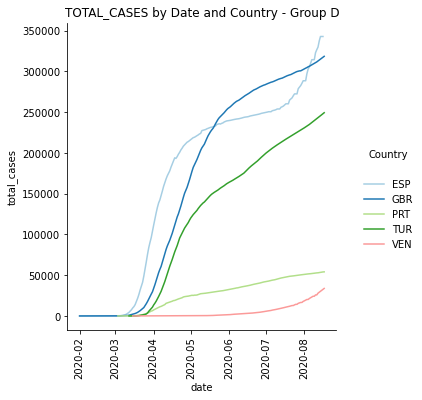

<Figure size 2160x720 with 0 Axes>

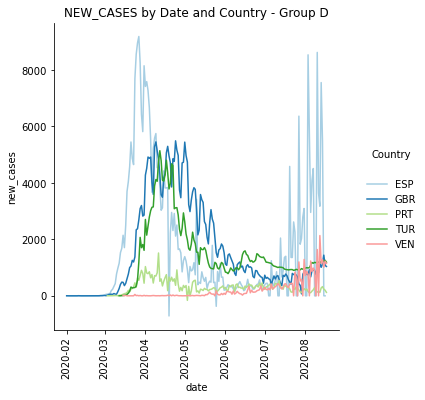

<Figure size 2160x720 with 0 Axes>

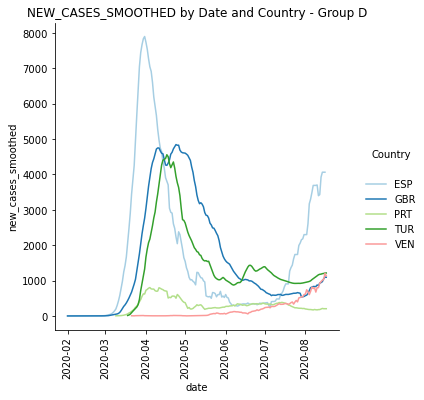

<Figure size 2160x720 with 0 Axes>

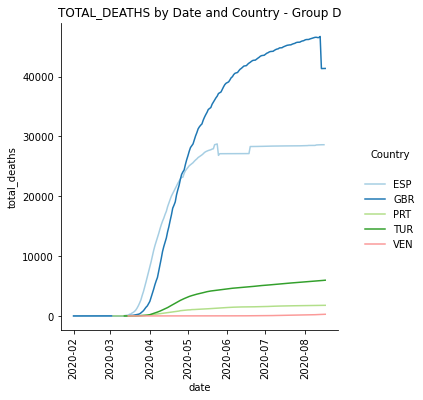

<Figure size 2160x720 with 0 Axes>

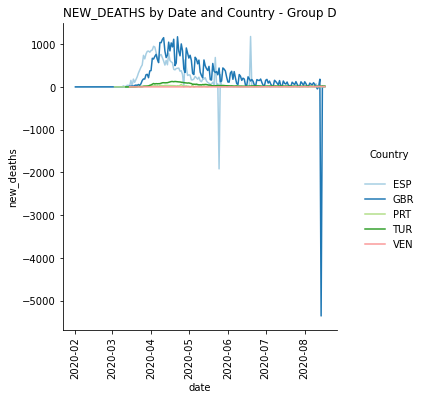

<Figure size 2160x720 with 0 Axes>

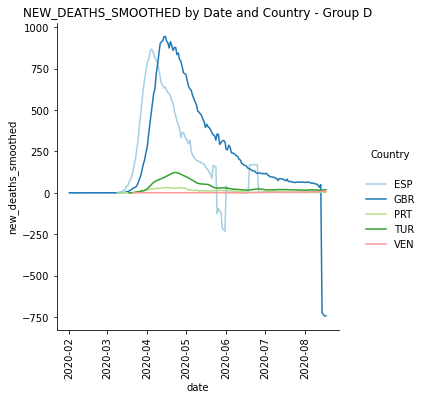

<Figure size 2160x720 with 0 Axes>

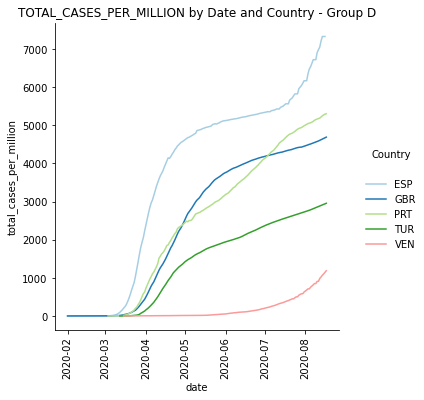

<Figure size 2160x720 with 0 Axes>

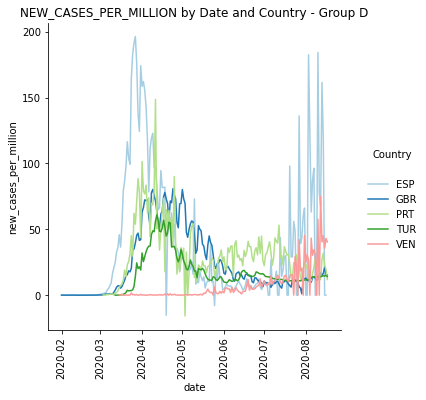

<Figure size 2160x720 with 0 Axes>

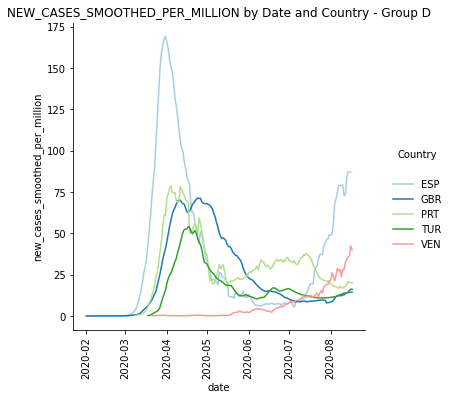

<Figure size 2160x720 with 0 Axes>

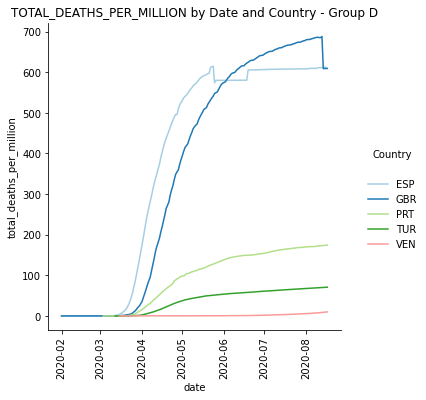

<Figure size 2160x720 with 0 Axes>

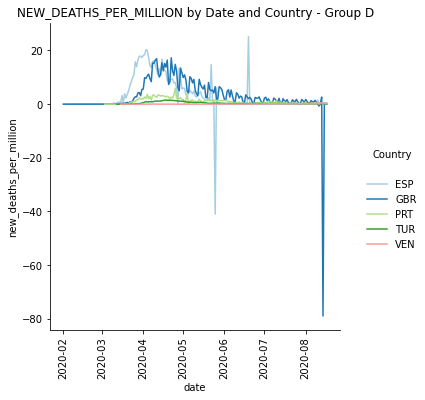

<Figure size 2160x720 with 0 Axes>

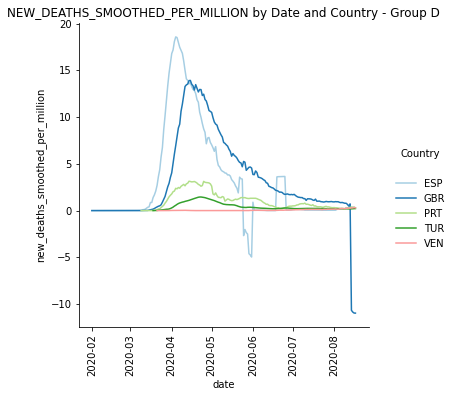

<Figure size 2160x720 with 0 Axes>

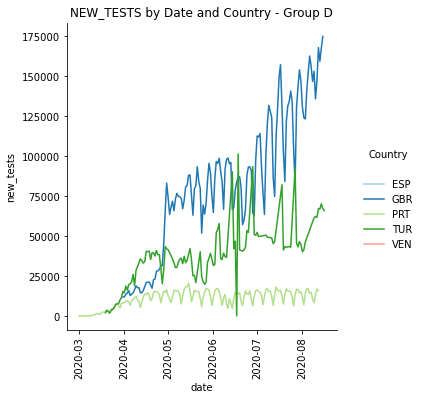

In [39]:
for elem in cols:
    graf_grupo("date" , elem , "iso_code", covid_grupoD, False )

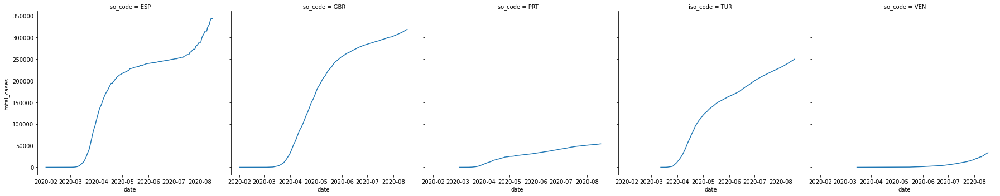

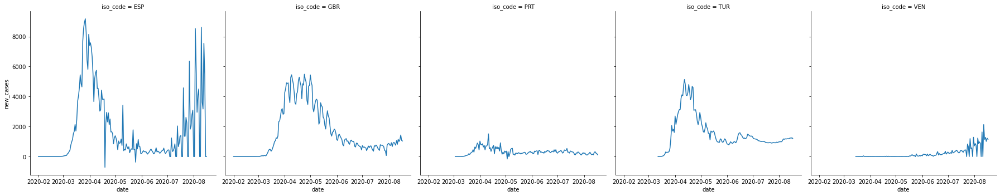

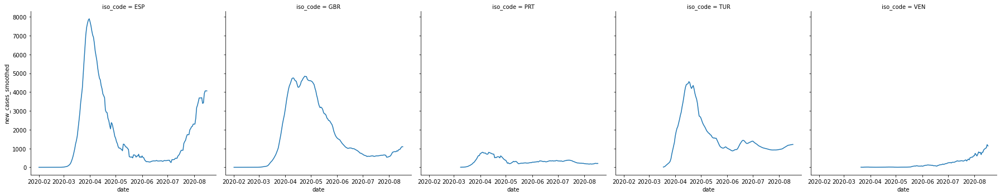

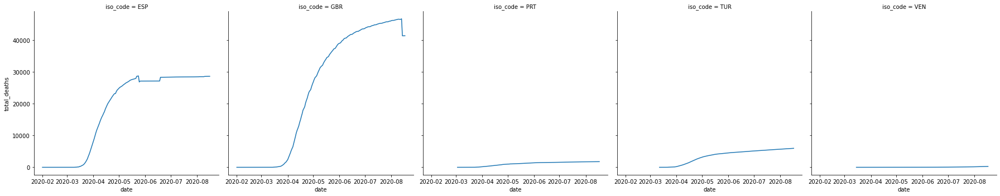

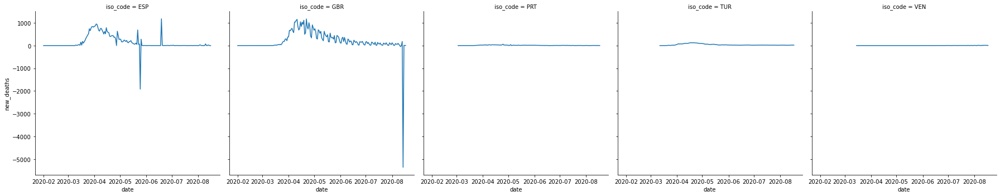

...

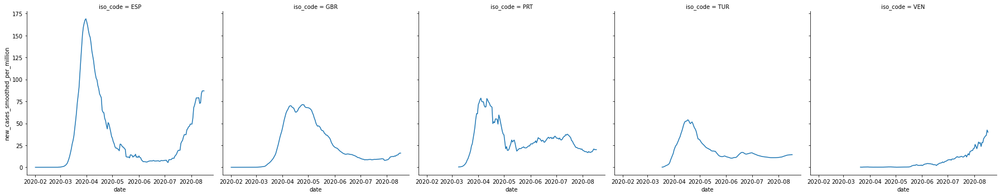

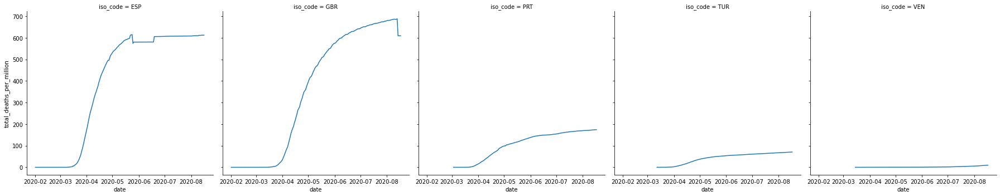

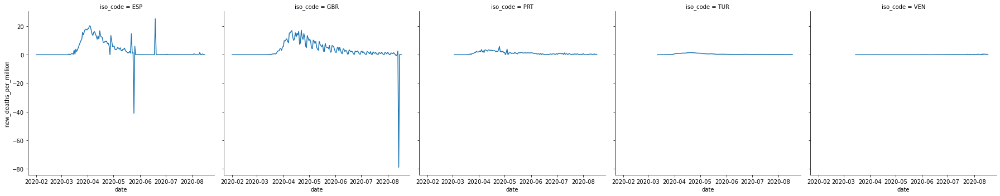

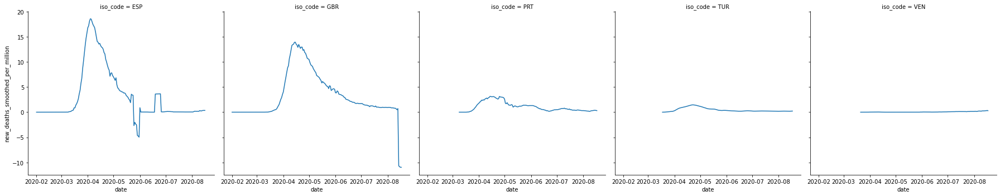

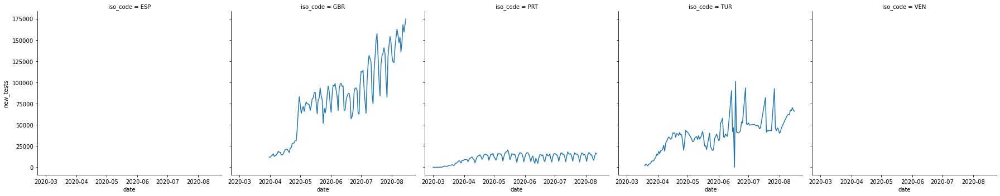

In [40]:
#Gráficos de cada variable separados por país
for elem in cols:
    sns.relplot(x="date", y=elem, col="iso_code", kind="line", data=covid_grupoD)

______________
## ANÁLISIS DETALLADO POR PAÍS
Show different tendencies for each column in your dataset. Show, vertically, the start date and end date of the alarm state in each plot
______________

### MUERTES TOTALES Y CASOS TOTALES DE CADA PAÍS (CONTRASTADOS CON FECHAS DE ESTADO DE ALARMA)

In [41]:
def graf_pais (ccode,col_dat, cname,cdf, y_maximo):
    if y_maximo:
        eje_y = cdf.total_cases.max()
        tit = cname.upper() + " COVID19 - TOTALES"
        filen= "Tot_"
    else:
        eje_y = cdf.rank_TCxM.max()
        tit = cname.upper() + " COVID19 - RANKING"
        filen= "Rank_"
    fg = cdf.plot(x="date", y= col_dat, kind="line", figsize=(12,8),title= tit)
    fg.legend(bbox_to_anchor=(1.2, 0.5))
    plt.vlines(alarm_dates.alarm_init[alarm_dates.iso_code == ccode].to_frame().iloc[0,0], ymin=0, ymax=eje_y, color = "r", linestyles =":")
    plt.vlines(alarm_dates.alarm_end[alarm_dates.iso_code == ccode].to_frame().iloc[0,0], ymin=0, ymax=eje_y, color = "r", linestyles =":")
    plt.savefig("../resources/"+ filen + elem+".png",bbox_inches='tight')
    plt.show()

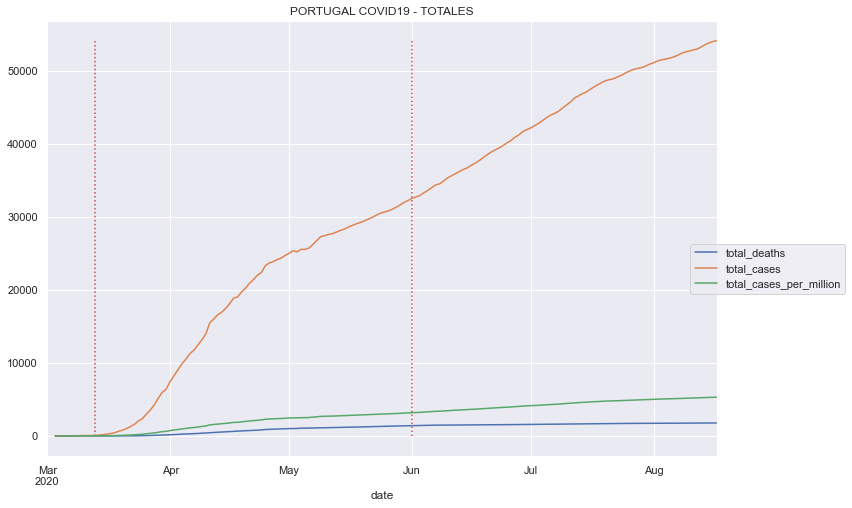

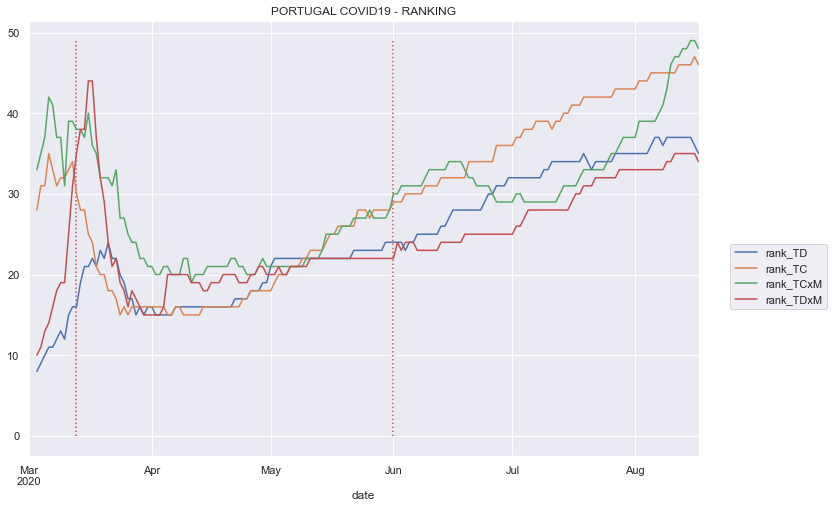

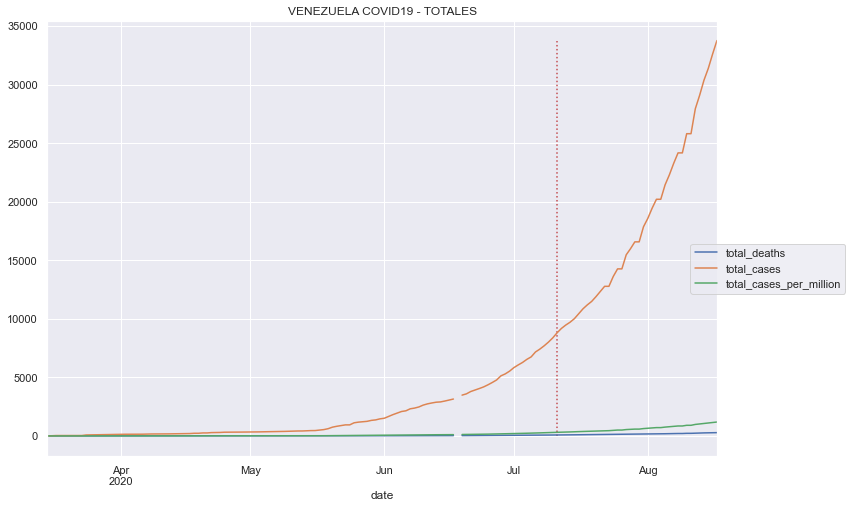

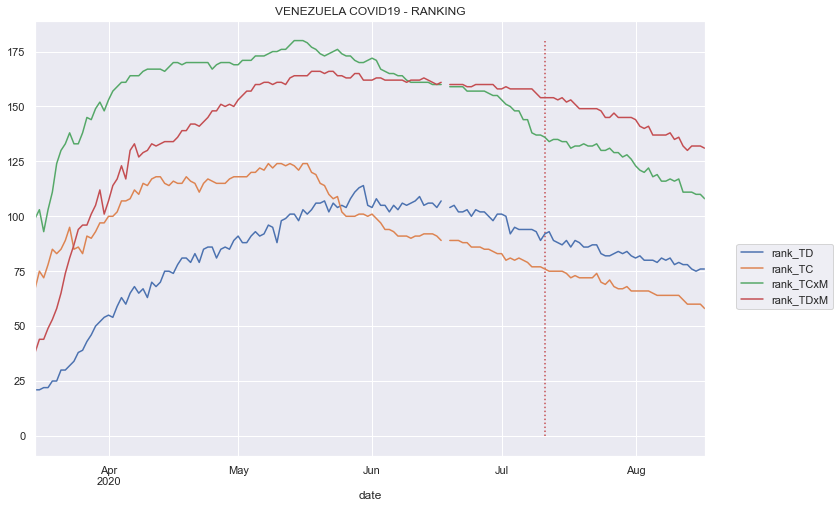

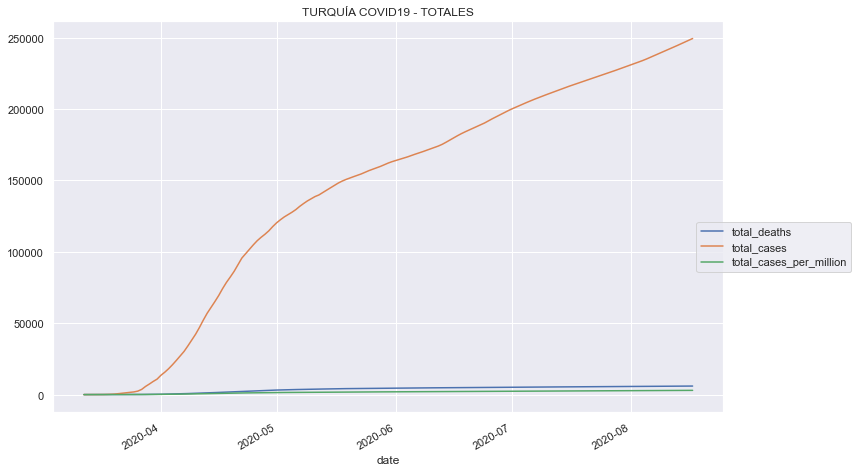

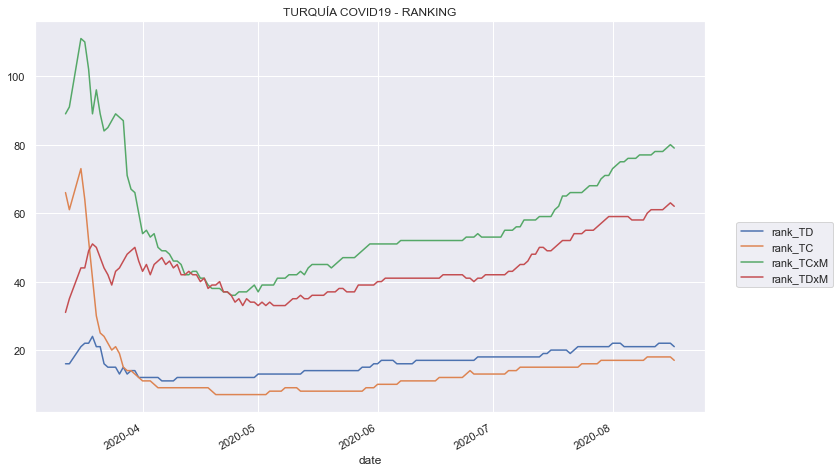

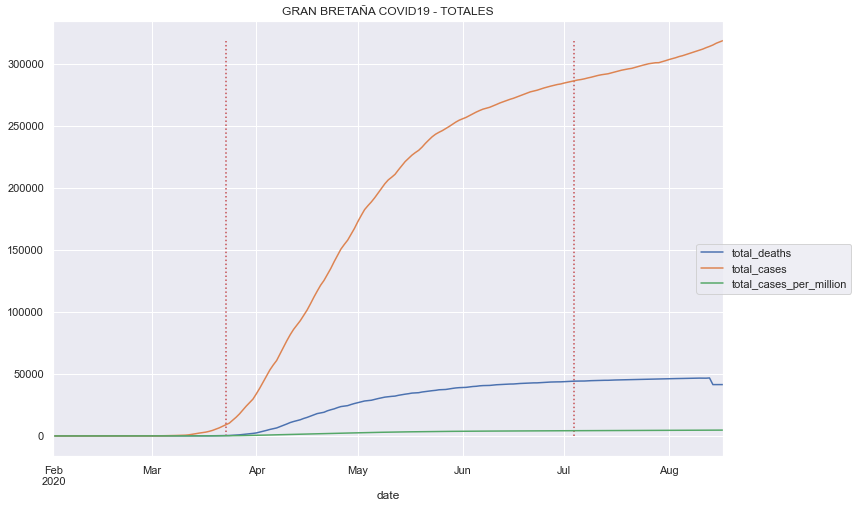

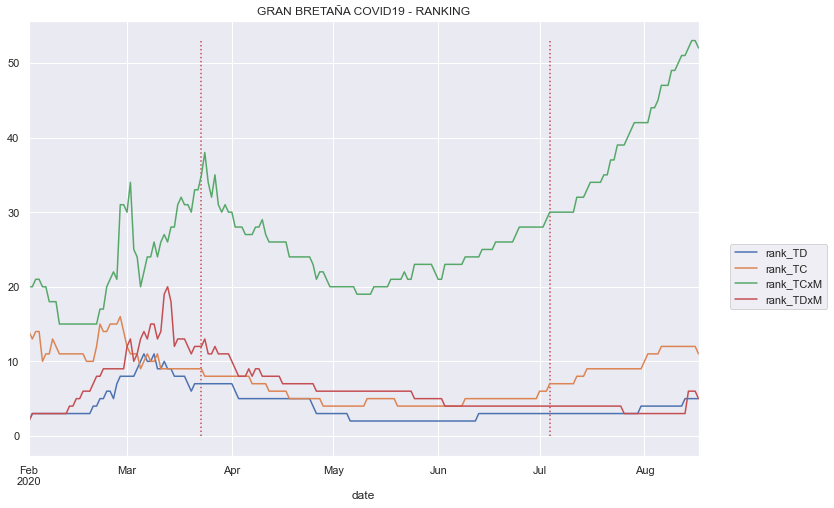

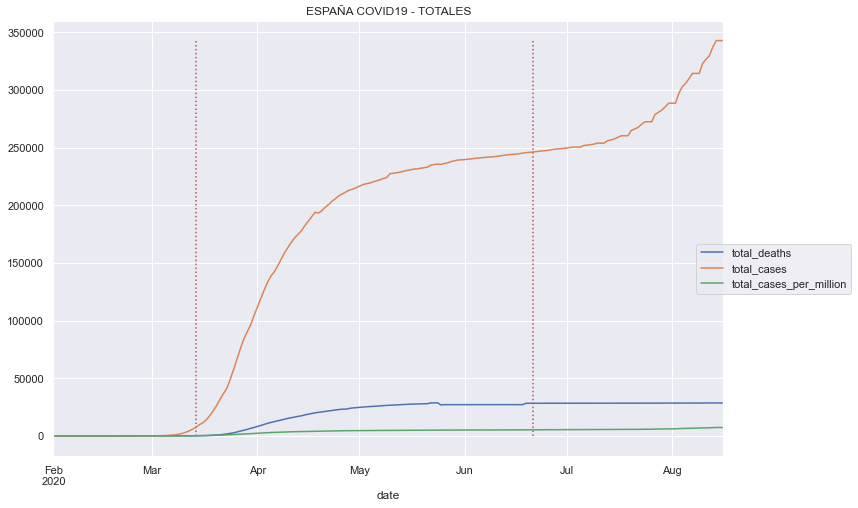

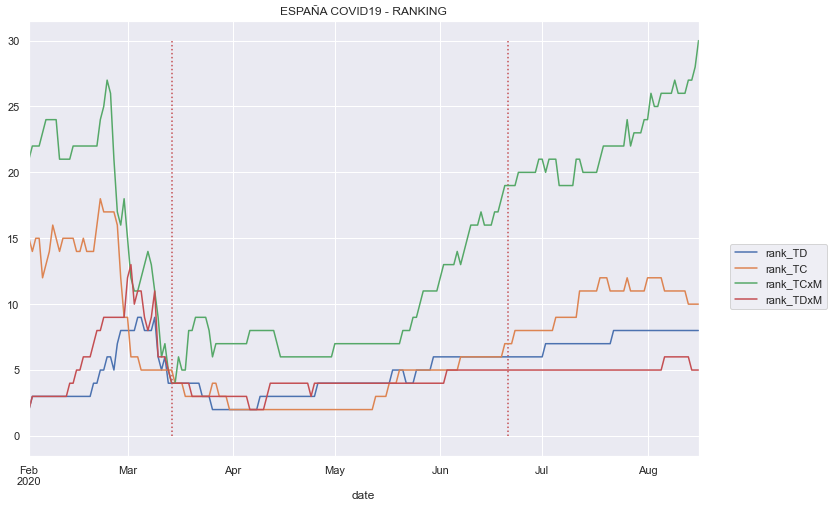

In [42]:
sns.set()
col_dat1 = ["total_deaths", "total_cases", "total_cases_per_million"]
col_dat2 = [ "rank_TD", "rank_TC", "rank_TCxM", "rank_TDxM"]
for elem in paises_grupoD:
    df = covid_grupoD[covid_grupoD.iso_code==elem]
    graf_pais(elem, col_dat1, paises_nombres[elem], df, True)
    graf_pais(elem, col_dat2, paises_nombres[elem], df, False)
  


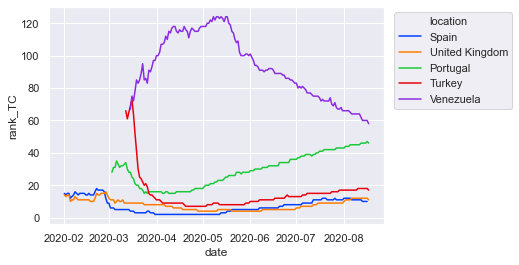

In [43]:
# Como han variado los paises en el rank_TC
lp = sns.lineplot('date','rank_TC', ci=None, hue='location', palette="bright",data=covid_grupoD) # dibujo grafico
lp.legend(loc='upper right', bbox_to_anchor=(1.4,1)) # cuadro de la leyenda 

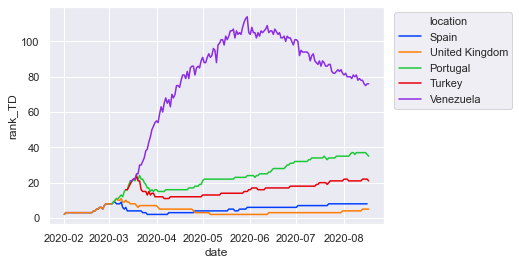

In [44]:
# Como han variado los paises en el rank_TD
lp = sns.lineplot('date','rank_TD', ci=None, hue='location', palette="bright",data=covid_grupoD) # dibujo grafico
lp.legend(loc='upper right', bbox_to_anchor=(1.4,1)) # cuadro de la leyenda 

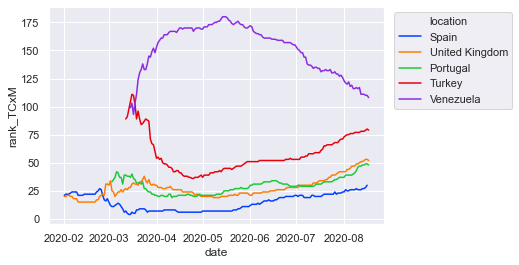

In [45]:
# Como han variado los paises en el rank_TCxM
lp = sns.lineplot('date','rank_TCxM', ci=None, hue='location', palette="bright",data=covid_grupoD) # dibujo grafico
lp.legend(loc='upper right', bbox_to_anchor=(1.4,1)) # cuadro de la leyenda 

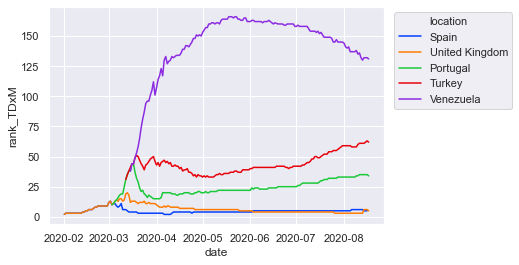

In [46]:
# Como han variado los paises en el rank_TDxM
lp = sns.lineplot('date','rank_TDxM', ci=None, hue='location', palette="bright",data=covid_grupoD) # dibujo grafico
lp.legend(loc='upper right', bbox_to_anchor=(1.4,1)) # cuadro de la leyenda 

In [47]:
# La idea es obtener un cuadro con el ranking que ocupa cada pais el ultimo de los días con datos, pero no es correcto porque nos da el valor máximo que a lo largo del tiempo a tenido cada país en los rankings.
covid_grupoD.groupby(['iso_code'])['date','rank_TC','rank_TD', 'rank_TDxM', 'rank_TCxM'].max()
#¿Teneis alguna idea de como se podría hacer?

,date,rank_TC,rank_TD,rank_TDxM,rank_TCxM
iso_code,,,,,
ESP,2020-08-16,18.0,9.0,13.0,30.0
GBR,2020-08-17,16.0,11.0,20.0,53.0
PRT,2020-08-17,47.0,37.0,44.0,49.0
TUR,2020-08-17,73.0,24.0,63.0,111.0
VEN,2020-08-17,124.0,114.0,166.0,180.0


In [48]:
covid_grupoD[covid_grupoD.iso_code =='ESP'].tail(3)

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM
195,10977,ESP,Europe,Spain,2020-08-14,342813.0,5479.0,4064.429,28617.0,12.0,...,99.403,7.17,27.4,31.4,2.97,83.56,10.0,8.0,27.0,5.0
196,10978,ESP,Europe,Spain,2020-08-15,342813.0,0.0,4064.429,28617.0,0.0,...,99.403,7.17,27.4,31.4,2.97,83.56,10.0,8.0,28.0,5.0
197,10979,ESP,Europe,Spain,2020-08-16,342813.0,0.0,4064.429,28617.0,0.0,...,99.403,7.17,27.4,31.4,2.97,83.56,10.0,8.0,30.0,5.0


In [49]:
#Dataframe con información resumida de datos referenciales por país
datos_paises = covid_grupoD.iloc[:,[1,20,21,22,23,24,29,30,32,33]].drop_duplicates()

In [50]:
datos_paises.info()
# Nota: 
# Stringency Index: The Government Response Stringency Index is a composite measure based on nine response indicators including
# school closures, workplace closures, and travel bans, rescaled to a value from 0 to 100 (100 = strictest response).

<class 'pandas.core.frame.DataFrame'>
Int64Index: 565 entries, 0 to 724
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         565 non-null    object 
 1   new_tests_per_thousand           426 non-null    float64
 2   new_tests_smoothed               543 non-null    float64
 3   new_tests_smoothed_per_thousand  543 non-null    float64
 4   tests_per_case                   541 non-null    float64
 5   positive_rate                    541 non-null    float64
 6   median_age                       565 non-null    float64
 7   aged_65_older                    565 non-null    float64
 8   gdp_per_capita                   565 non-null    float64
 9   extreme_poverty                  564 non-null    float64
dtypes: float64(9), object(1)
memory usage: 46.3+ KB


In [51]:
datos_paises

,iso_code,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,median_age,aged_65_older,gdp_per_capita,extreme_poverty
0,ESP,NaN,NaN,NaN,NaN,NaN,45.5,19.436,34272.360,1.0
79,ESP,NaN,10529.0,0.225,3.592,0.278,45.5,19.436,34272.360,1.0
80,ESP,NaN,10529.0,0.225,3.621,0.276,45.5,19.436,34272.360,1.0
81,ESP,NaN,10529.0,0.225,4.040,0.248,45.5,19.436,34272.360,1.0
82,ESP,NaN,10529.0,0.225,4.251,0.235,45.5,19.436,34272.360,1.0
...,...,...,...,...,...,...,...,...,...,...
719,TUR,0.793,62868.0,0.745,53.149,0.019,31.6,8.153,25129.341,0.2
720,TUR,0.832,64284.0,0.762,53.762,0.019,31.6,8.153,25129.341,0.2
721,TUR,0.797,65274.0,0.774,54.324,0.018,31.6,8.153,25129.341,0.2
722,TUR,0.782,65918.0,0.782,54.317,0.018,31.6,8.153,25129.341,0.2


_________
## CORRELACIÓN
______________

In [52]:
covid_grupoD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 880 entries, 0 to 879
Data columns (total 44 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   index                            880 non-null    int64         
 1   iso_code                         880 non-null    object        
 2   continent                        880 non-null    object        
 3   location                         880 non-null    object        
 4   date                             880 non-null    datetime64[ns]
 5   total_cases                      877 non-null    float64       
 6   new_cases                        877 non-null    float64       
 7   new_cases_smoothed               862 non-null    float64       
 8   total_deaths                     877 non-null    float64       
 9   new_deaths                       877 non-null    float64       
 10  new_deaths_smoothed              862 non-null    float64      

In [53]:
#Matriz de correlación entre variables
grupoD_corr = covid_grupoD.iloc[:,np.r_[1,5,7,9,11,22:36]]     #Un subconjunto de las variables a contrastar

In [54]:
grupoD_corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 880 entries, 0 to 879
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         880 non-null    object 
 1   total_cases                      877 non-null    float64
 2   new_cases_smoothed               862 non-null    float64
 3   new_deaths                       877 non-null    float64
 4   total_cases_per_million          877 non-null    float64
 5   new_tests_smoothed_per_thousand  543 non-null    float64
 6   tests_per_case                   541 non-null    float64
 7   positive_rate                    541 non-null    float64
 8   tests_units                      571 non-null    object 
 9   stringency_index                 847 non-null    float64
 10  population                       880 non-null    float64
 11  population_density               880 non-null    float64
 12  median_age            

In [55]:
grupoD_corr.shape

(880, 19)

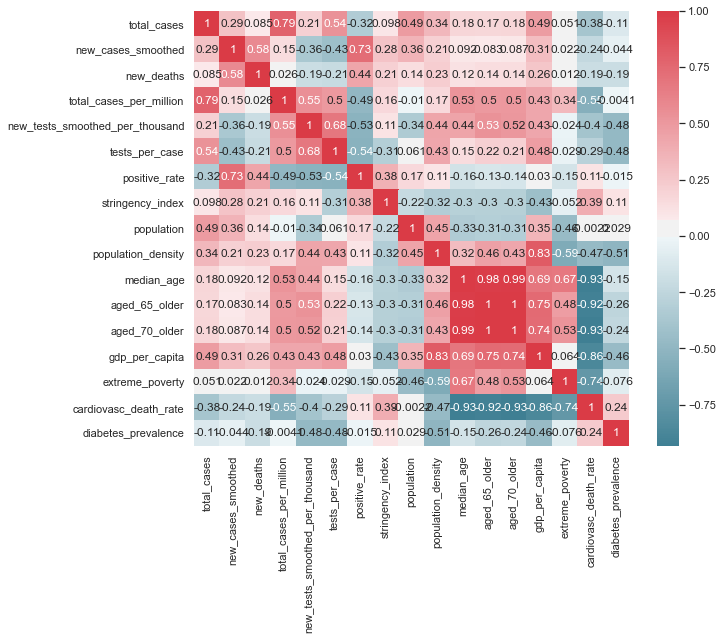

In [56]:
f, ax = plt.subplots(figsize=(10, 8)) 
corr = grupoD_corr.corr() 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), 
      square=True, ax=ax, annot=True) 

## Matriz de correlación Todos los países.

In [57]:
#Seleccion del DF mundial del subconjunto de las variables a correlacionar
world_df_corr = world_df.iloc[:,np.r_[0,4,6,8,10,21:33,34:36]]    

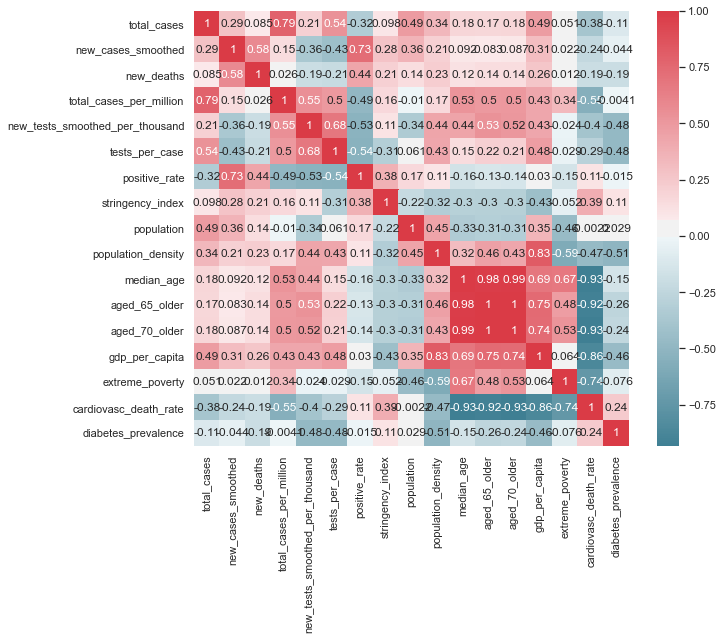

In [58]:
#Mapa de calor de la matriz de correlación 
f, ax = plt.subplots(figsize=(10, 8)) 
corr2 = world_df_corr.corr() 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True), 
      square=True, ax=ax, annot=True) 

### NOTA:Otras pruebas. No considerar este código

In [59]:
#Dejar únicamente las columnas que interesan para la evaluación del ranking
#world_df = world_df[["iso_code", "continent", "location", "date", "total_cases", "total_deaths", "total_cases_per_million", "stringency_index", "population", "population_density","hospital_beds_per_thousand", "life_expectancy" ]]

In [60]:
#Crea un DF por cada país (llamado covid_ESP, etc) a partir de los datos del dataframe covid_grupoD. 
#for elem in paises_grupoD:
#    df_name = "covid_" + elem
#    globals()[df_name] = covid_grupoD[covid_grupoD.iso_code==elem]

In [61]:
#for elem in cols_rank:
#    sns.relplot(x="date", y=elem, col="iso_code", kind="line", data=rank_grupoD)

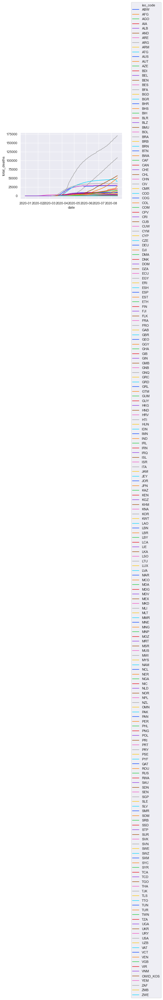

In [62]:
# Pruebas de Jose Luis.
# Para graficar total deaths de todos los paises.
lp = sns.lineplot('date','total_deaths', ci=None, hue='iso_code', palette="bright",data=world_df)
lp.legend(loc='upper right', bbox_to_anchor=(1.4,3))

# Para las líneas verticales del estado de alarma de un pais
#xposition = [pd.to_datetime('2020-03-14'), pd.to_datetime('2020-06-16')]
#for xc in xposition:
#    lp.axvline(x=xc, color='red', linestyle='--')

In [63]:
# Otra forma de graficar las total deaths de todos los paises.
fig = px.line(world_df, x="date", y="total_deaths", color="continent", line_group="location", hover_name="location",
        line_shape="spline", render_mode="svg")
fig.show()

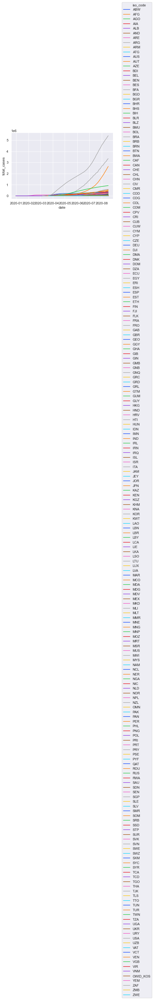

In [64]:
# Para graficar total cases de todos los paises.
lp = sns.lineplot('date','total_cases', ci=None, hue='iso_code', palette="bright",data=world_df)
lp.legend(loc='upper right', bbox_to_anchor=(1.4,3))

In [65]:
# Otra forma de graficar las total cases de todos los paises.
fig = px.line(world_df, x="date", y="total_cases", color="continent", line_group="location", hover_name="location",
        line_shape="spline", render_mode="svg")
fig.show()

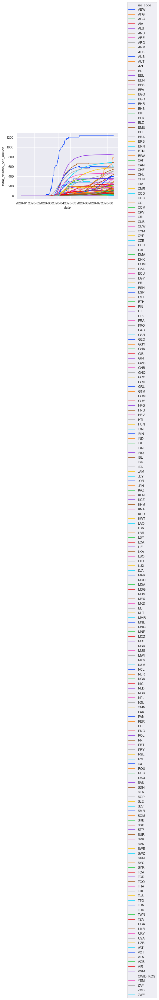

In [66]:
# Para graficar total deaths per million de todos los paises.
lp = sns.lineplot('date','total_deaths_per_million', ci=None, hue='iso_code', palette="bright",data=world_df)
lp.legend(loc='upper right', bbox_to_anchor=(1.4,3))

In [67]:
# Otra forma de graficar las total deaths per million de todos los paises.
# Como efecto secundario en la gráfica se puede ver el ranking y ohh sorpresa el nº1 es... San Marino.
fig = px.line(world_df, x="date", y="total_deaths_per_million", color="continent", line_group="location", hover_name="location",
        line_shape="spline", render_mode="svg")
fig.show()

In [68]:
# Para poder establecer algún tipo de relación entre población de +65 y muertes por covid
# paises_grupoD=["PRT", "VEN", "TUR", "GBR", "ESP"]
# paises_nombres={"PRT":"Portugal", "VEN":"Venezuela", "TUR":"Turquía", "GBR":"Gran Bretaña", "ESP":"España"}
# covid_grupoD=world_df[world_df.iso_code.isin(paises_grupoD)]
covid_grupoD.groupby('iso_code')['total_deaths'].max()

iso_code
ESP    28752.0
GBR    46706.0
PRT     1778.0
TUR     5974.0
VEN      281.0
Name: total_deaths, dtype: float64

In [69]:
# Añado la columna del indice de mortalidad al df
covid_grupoD['mortality_rate'] = round((covid_grupoD['total_deaths']/covid_grupoD['total_cases'])*100, 2)

In [70]:
covid_grupoD.tail()

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
875,36017,VEN,South America,Venezuela,2020-08-13,29088.0,1150.0,969.857,247.0,9.0,...,6.47,NaN,NaN,0.8,72.06,60.0,78.0,111.0,130.0,0.85
876,36018,VEN,South America,Venezuela,2020-08-14,30369.0,1281.0,1012.714,259.0,12.0,...,6.47,NaN,NaN,0.8,72.06,60.0,76.0,111.0,132.0,0.85
877,36019,VEN,South America,Venezuela,2020-08-15,31381.0,1012.0,1030.714,266.0,7.0,...,6.47,NaN,NaN,0.8,72.06,60.0,75.0,110.0,132.0,0.85
878,36020,VEN,South America,Venezuela,2020-08-16,32607.0,1226.0,1205.857,276.0,10.0,...,6.47,NaN,NaN,0.8,72.06,60.0,76.0,110.0,132.0,0.85
879,36021,VEN,South America,Venezuela,2020-08-17,33755.0,1148.0,1135.714,281.0,5.0,...,6.47,NaN,NaN,0.8,72.06,58.0,76.0,108.0,131.0,0.83


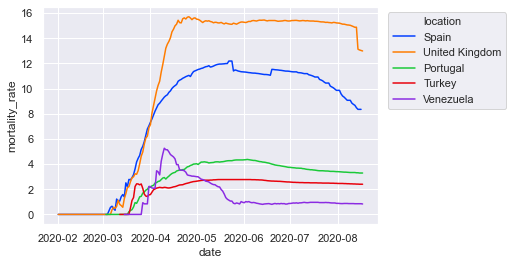

In [71]:
# Como a variado el indice de mortalidad
lp = sns.lineplot('date','mortality_rate', ci=None, hue='location', palette="bright",data=covid_grupoD) # dibujo grafico
lp.legend(loc='upper right', bbox_to_anchor=(1.4,1)) # cuadro de la leyenda 

In [72]:
# Igual que la anterior pero con otro metodo 
fig = px.line(covid_grupoD, x="date", y="mortality_rate", color="location", line_group="location", hover_name="location",
        line_shape="spline", render_mode="svg")
fig.show()

In [73]:
world_df_map = (world_df.groupby('location')['total_cases'].max()).to_frame()
world_df_map['index'] = world_df_map.index
world_df_map.rename(columns={'index': 'country'}, inplace=True)
world_df_map

,total_cases,country
location,,
Afghanistan,37596.0,Afghanistan
Albania,7380.0,Albania
Algeria,38583.0,Algeria
Andorra,989.0,Andorra
Angola,1879.0,Angola
...,...,...
Vietnam,964.0,Vietnam
Western Sahara,766.0,Western Sahara
Yemen,1869.0,Yemen


In [74]:
fig = px.choropleth(world_df_map, locations=world_df_map['country'],
                    color=world_df_map['total_cases'],locationmode='country names', 
                    hover_name=world_df_map['country'], 
                    color_continuous_scale=px.colors.sequential.Tealgrn,template='plotly_white', )
fig.update_layout(title='Total Cases In Each Country',)
fig.show()

In [75]:
world_df_map_td = (world_df.groupby('location')['total_deaths'].max()).to_frame()
world_df_map_td['index'] = world_df_map_td.index
world_df_map_td.rename(columns={'index': 'country'}, inplace=True)

In [76]:
fig = px.choropleth(world_df_map_td, locations=world_df_map_td['country'],
                    color=world_df_map_td['total_deaths'],locationmode='country names', 
                    hover_name=world_df_map_td['country'], 
                    color_continuous_scale=px.colors.sequential.Tealgrn,template='plotly_white', )
fig.update_layout(title='Total Deaths in each Country',)
fig.show()

In [77]:
# Obtengo dataframe de España desde el dia que se notifica el primer caso en España.
covid_grupoD_ESP = covid_grupoD[(covid_grupoD['iso_code'] == 'ESP') & (covid_grupoD['total_cases']>0)] 
covid_grupoD_ESP.head(3)

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
0,10782,ESP,Europe,Spain,2020-02-01,1.0,1.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,2.0,21.0,2.0,0.0
1,10783,ESP,Europe,Spain,2020-02-02,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,14.0,3.0,22.0,3.0,0.0
2,10784,ESP,Europe,Spain,2020-02-03,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,3.0,22.0,3.0,0.0


In [78]:
# Grafico de barras de España con los casos y las muertes diarias.
fig = go.Figure(data=[
    go.Bar(name='New daily cases', x=covid_grupoD_ESP['date'], y=covid_grupoD_ESP['new_cases']),
    go.Bar(name='Daily deaths', x=covid_grupoD_ESP['date'], y=covid_grupoD_ESP['new_deaths'])])
# Change the bar mode
fig.update_layout(barmode='overlay', title='Daily Case and Daily Death en España',
                 annotations=[dict(x='2020-03-15', y=1407, xref="x", yref="y", text="Lockdown started", showarrow=True, arrowhead=1, ax=-50, ay=-70)])
fig.show()

In [79]:
import plotly.express as px
import time
import plotly.graph_objs as go
import plotly.offline as py
import plotly.io as pio
py.offline.init_notebook_mode(connected=True)

In [80]:
# Obtengo dataframe de Gran Bretaña desde el dia que se notifica el primer caso.
covid_grupoD_GBR = covid_grupoD[(covid_grupoD['iso_code'] == 'GBR') & (covid_grupoD['total_cases']>0)] 
covid_grupoD_GBR.head()

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
198,12521,GBR,Europe,United Kingdom,2020-02-01,2.0,2.0,0.286,0.0,0.0,...,4.28,20.0,24.7,2.54,81.32,14.0,2.0,20.0,2.0,0.0
199,12522,GBR,Europe,United Kingdom,2020-02-02,2.0,0.0,0.286,0.0,0.0,...,4.28,20.0,24.7,2.54,81.32,13.0,3.0,20.0,3.0,0.0
200,12523,GBR,Europe,United Kingdom,2020-02-03,2.0,0.0,0.286,0.0,0.0,...,4.28,20.0,24.7,2.54,81.32,14.0,3.0,21.0,3.0,0.0
201,12524,GBR,Europe,United Kingdom,2020-02-04,2.0,0.0,0.286,0.0,0.0,...,4.28,20.0,24.7,2.54,81.32,14.0,3.0,21.0,3.0,0.0
202,12525,GBR,Europe,United Kingdom,2020-02-05,3.0,1.0,0.429,0.0,0.0,...,4.28,20.0,24.7,2.54,81.32,10.0,3.0,20.0,3.0,0.0


Grafico de barras animado que muestra como aumenta diariamente el número de new_cases

In [81]:
covid_grupoD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 880 entries, 0 to 879
Data columns (total 45 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   index                            880 non-null    int64         
 1   iso_code                         880 non-null    object        
 2   continent                        880 non-null    object        
 3   location                         880 non-null    object        
 4   date                             880 non-null    datetime64[ns]
 5   total_cases                      877 non-null    float64       
 6   new_cases                        877 non-null    float64       
 7   new_cases_smoothed               862 non-null    float64       
 8   total_deaths                     877 non-null    float64       
 9   new_deaths                       877 non-null    float64       
 10  new_deaths_smoothed              862 non-null    float64      

In [82]:
covid_grupoD_infected = covid_grupoD.iloc[:,[1,3,4,5,6,7,8,22,23]]
covid_grupoD_infected

,iso_code,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_tests_smoothed_per_thousand,tests_per_case
0,ESP,Spain,2020-02-01,1.0,1.0,0.143,0.0,NaN,NaN
1,ESP,Spain,2020-02-02,1.0,0.0,0.143,0.0,NaN,NaN
2,ESP,Spain,2020-02-03,1.0,0.0,0.143,0.0,NaN,NaN
3,ESP,Spain,2020-02-04,1.0,0.0,0.143,0.0,NaN,NaN
4,ESP,Spain,2020-02-05,1.0,0.0,0.143,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
875,VEN,Venezuela,2020-08-13,29088.0,1150.0,969.857,247.0,NaN,NaN
876,VEN,Venezuela,2020-08-14,30369.0,1281.0,1012.714,259.0,NaN,NaN
877,VEN,Venezuela,2020-08-15,31381.0,1012.0,1030.714,266.0,NaN,NaN
878,VEN,Venezuela,2020-08-16,32607.0,1226.0,1205.857,276.0,NaN,NaN


In [83]:
covid_grupoD_infected["new_date"] = covid_grupoD_infected.date.apply(lambda x: x.strftime("%d %b, %Y"))
covid_grupoD_infected.fillna(0, inplace=True)

In [84]:
total_s = covid_grupoD_infected[covid_grupoD_infected['date']>'2020-03-15']
total_s

,iso_code,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_tests_smoothed_per_thousand,tests_per_case,new_date
44,ESP,Spain,2020-03-16,11491.0,1706.0,1423.429,288.0,0.0,0.0,"16 Mar, 2020"
45,ESP,Spain,2020-03-17,13994.0,2503.0,1670.714,309.0,0.0,0.0,"17 Mar, 2020"
46,ESP,Spain,2020-03-18,17688.0,3694.0,2059.143,491.0,0.0,0.0,"18 Mar, 2020"
47,ESP,Spain,2020-03-19,21735.0,4047.0,2472.571,598.0,0.0,0.0,"19 Mar, 2020"
48,ESP,Spain,2020-03-20,26304.0,4569.0,2906.571,767.0,0.0,0.0,"20 Mar, 2020"
...,...,...,...,...,...,...,...,...,...,...
875,VEN,Venezuela,2020-08-13,29088.0,1150.0,969.857,247.0,0.0,0.0,"13 Aug, 2020"
876,VEN,Venezuela,2020-08-14,30369.0,1281.0,1012.714,259.0,0.0,0.0,"14 Aug, 2020"
877,VEN,Venezuela,2020-08-15,31381.0,1012.0,1030.714,266.0,0.0,0.0,"15 Aug, 2020"
878,VEN,Venezuela,2020-08-16,32607.0,1226.0,1205.857,276.0,0.0,0.0,"16 Aug, 2020"


In [85]:
total_bar = total_s.groupby(["date","new_date",'iso_code','location'])["location","total_cases","new_cases","total_deaths","new_deaths"].sum().reset_index()
total_bar

KeyError: "Columns not found: 'new_deaths'"

In [86]:
fig = px.bar(total_bar, x="location", y="total_cases", color="location",
              animation_frame="new_date", animation_group="iso_code",  range_y=[0,total_bar.total_cases.max()+1000],title= "Total cases by Country") 
fig.show()

NameError: name 'total_bar' is not defined

-----
Voy a crear un df con los datos sumados de los 5 paises de nuestro estudio por día.
Realizare graficos de barras, lineas, puntos y quesitos del df obtenido anteriormente llamado covid_grupo_infected 

In [87]:
st = covid_grupoD_infected.groupby("date")["new_cases","new_deaths"].sum().reset_index()
st.head(5)

KeyError: "Columns not found: 'new_deaths'"

In [88]:
# Create with bars the daily deaths and infected in the five countries.
fig = go.Figure(data=[
    go.Bar(name='Daily cases', x=st['date'], y=st['new_cases']),
    go.Bar(name='Daily deaths', x=st['date'], y=st['new_deaths'])])
# Change the bar mode
fig.update_layout(barmode='overlay', title='Daily New Casea and Deaths in ESP, PRT, VEN, GBR, TUR')
fig.show()

NameError: name 'st' is not defined

In [89]:
covid_infected_ESP = covid_grupoD_infected[covid_grupoD_infected['iso_code']== 'ESP']
covid_infected_ESP.head(5)

,iso_code,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_tests_smoothed_per_thousand,tests_per_case,new_date
0,ESP,Spain,2020-02-01,1.0,1.0,0.143,0.0,0.0,0.0,"01 Feb, 2020"
1,ESP,Spain,2020-02-02,1.0,0.0,0.143,0.0,0.0,0.0,"02 Feb, 2020"
2,ESP,Spain,2020-02-03,1.0,0.0,0.143,0.0,0.0,0.0,"03 Feb, 2020"
3,ESP,Spain,2020-02-04,1.0,0.0,0.143,0.0,0.0,0.0,"04 Feb, 2020"
4,ESP,Spain,2020-02-05,1.0,0.0,0.143,0.0,0.0,0.0,"05 Feb, 2020"


In [90]:
# If I will want create for every country
# Utilizo los df que he creado anteriormente para cada país
fig = go.Figure(data=[
    go.Bar(name='Daily cases', x=covid_infected_ESP['date'], y=covid_infected_ESP['new_cases']),
    go.Bar(name='Daily deaths', x=covid_infected_ESP['date'], y=covid_infected_ESP['new_deaths'])])
# Change the bar mode
fig.update_layout(barmode='overlay', title='Daily Case and Death in ESP')
fig.show()

KeyError: 'new_deaths'

Si lo veis interesante se pueden sacar los graficos para los otros cuatro paises.

In [91]:
#Grafico de puntos para nuevos casos diarios
fig = px.scatter(covid_grupoD_infected, x="date", y="new_cases", color="location",
                 facet_col="iso_code", title="Daily new Cases")
fig.update_xaxes(showgrid=False)
fig.show()

In [92]:
#Grafico de puntos para nuevos casos diarios
fig = px.scatter(covid_grupoD_infected, x="date", y="new_deaths", color="location",
                 facet_col="iso_code", title="Daily new Deaths")
fig.update_xaxes(showgrid=False)
fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['iso_code', 'location', 'date', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_tests_smoothed_per_thousand', 'tests_per_case', 'new_date'] but received: new_deaths

In [93]:
#Grafico de puntos sobre los nuevos casos diarios en España.
fig = px.scatter(covid_infected_ESP, x="date", y="new_cases", color="location",
                 facet_col="iso_code", title="Nuevos casos diarios en España")
fig.update_xaxes(showgrid=False)
fig.show()

In [94]:
#Grafico de puntos sobre los fallecimientos diarios en España.
fig = px.scatter(covid_infected_ESP, x="date", y="new_deaths", color="location",
                 facet_col="iso_code", title="Fallecimientos diarios en España")
fig.update_xaxes(showgrid=False)
fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['iso_code', 'location', 'date', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_tests_smoothed_per_thousand', 'tests_per_case', 'new_date'] but received: new_deaths

In [95]:
#Grafico de puntos sobre los nuevos casos diarios en GBR.
fig = px.scatter(covid_grupoD_GBR, x="date", y="new_cases", color="location",
                 facet_col="iso_code", title="Nuevos casos diarios en GBR")
fig.update_xaxes(showgrid=True)
fig.show()

In [96]:
#Grafico de puntos sobre los nuevos fallecimientos diarios en GBR.
fig = px.scatter(covid_grupoD_GBR, x="date", y="new_deaths", color="location",
                 facet_col="iso_code", title="Nuevos fallecimientos diarios en GBR")
fig.update_xaxes(showgrid=True)
fig.show()

Se podria continuar con el resto de los paises

In [97]:
covid_grupoD.head(5)

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
0,10782,ESP,Europe,Spain,2020-02-01,1.0,1.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,2.0,21.0,2.0,0.0
1,10783,ESP,Europe,Spain,2020-02-02,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,14.0,3.0,22.0,3.0,0.0
2,10784,ESP,Europe,Spain,2020-02-03,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,3.0,22.0,3.0,0.0
3,10785,ESP,Europe,Spain,2020-02-04,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,3.0,22.0,3.0,0.0
4,10786,ESP,Europe,Spain,2020-02-05,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,12.0,3.0,23.0,3.0,0.0


# Are there outliers or some rare data?
See if there are some outliers for the columns:
- new_cases, new_deaths
- total_cases_per_million, new_cases_per_million

(total_cases & total_deaths no creo que tenga mucho interes graficarlos ya que son cantidades acumulativas y aunque en algún mto puntual suban o bajen, como cuando España reviso las cifras, nuncan van a ser outliers. No obstante grafico total_deaths para que se pueda comprobar)

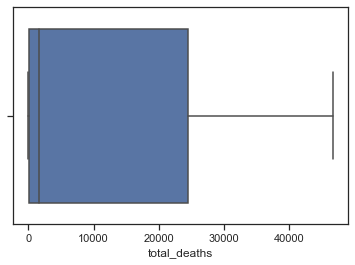

In [98]:
# Outliers de total_deaths
sns.set(style="ticks")
ax = sns.boxplot(x=covid_grupoD["total_deaths"])

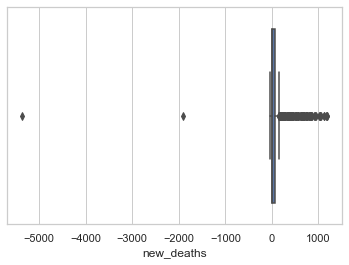

In [99]:
# Para visualizar los posibles outliers de la columna new_deaths del df de los 5 paises asignados.
sns.set(style="whitegrid")
ax = sns.boxplot(x=covid_grupoD["new_deaths"])

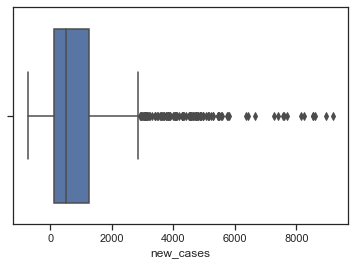

In [100]:
# Busqueda de outliers de new_cases
sns.set(style="ticks")
ax = sns.boxplot(x=covid_grupoD["new_cases"])

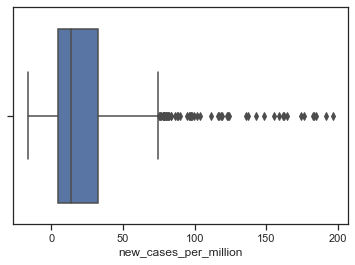

In [101]:
# Busqueda de outliers de new_cases_per_million
sns.set(style="ticks")
ax = sns.boxplot(x=covid_grupoD["new_cases_per_million"]) 

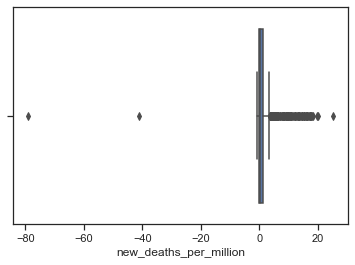

In [102]:
# Busqueda de outliers de new_deaths_per_million
sns.set(style="ticks")
ax = sns.boxplot(x=covid_grupoD["new_deaths_per_million"])

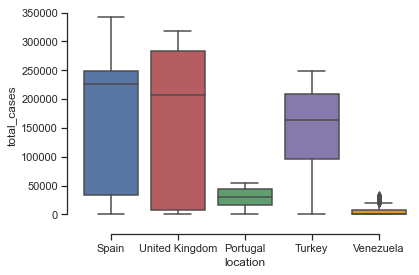

In [103]:
# Boxplot para mostrar casos totales por pais
sns.set(style="ticks", palette="vlag")
sns.boxplot(x="location", y="total_cases",
             palette=["b", "r","g","m","orange"],
            data=covid_grupoD)
sns.despine(offset=10, trim=True)

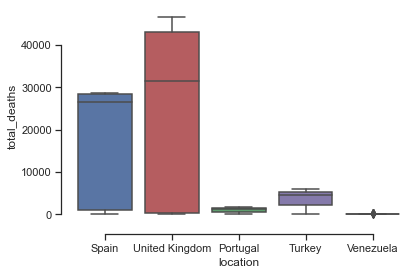

In [104]:
# Boxplot para mostrar muertes totales por pais
sns.set(style="ticks", palette="vlag")
sns.boxplot(x="location", y="total_deaths",
             palette=["b", "r","g","m","orange"],
            data=covid_grupoD)
sns.despine(offset=10, trim=True)

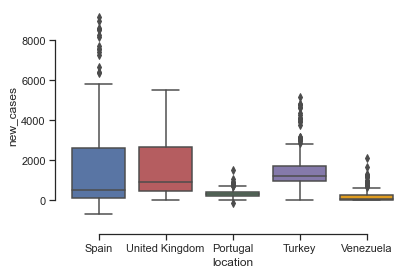

In [105]:
# Boxplot para mostrar casos diarios por pais
sns.set(style="ticks", palette="vlag")
sns.boxplot(x="location", y="new_cases",
             palette=["b", "r","g","m","orange"],
            data=covid_grupoD)
sns.despine(offset=10, trim=True)

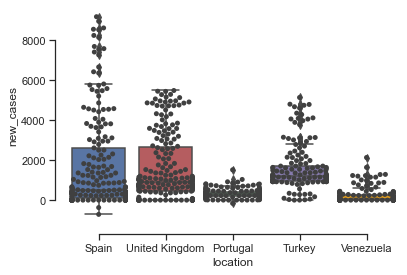

In [106]:
# Boxplot para mostrar casos diarios por pais mostrando los puntos sobre las cajas
sns.set(style="ticks", palette="vlag")
sns.boxplot(x="location", y="new_cases",
             palette=["b", "r","g","m","orange"],
            data=covid_grupoD)
sns.despine(offset=10, trim=True)
ax = sns.swarmplot(x="location", y="new_cases", data=covid_grupoD, color=".25")

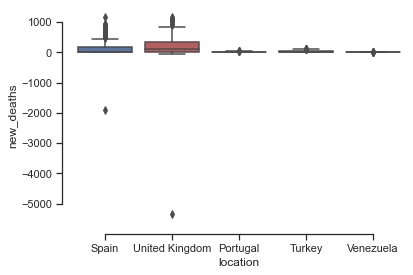

In [107]:
# Boxplot para mostrar muertes diarias por pais
sns.set(style="ticks", palette="vlag")
sns.boxplot(x="location", y="new_deaths",
             palette=["b", "r","g","m","orange"],
            data=covid_grupoD)
sns.despine(offset=10, trim=True)

In [108]:
-----
Para representar los casos y fallecidos totales mediante pie charts.

SyntaxError: invalid syntax (<ipython-input-108-07d401dd0a1a>, line 1)

In [109]:
covid_grupoD_total= covid_grupoD_infected.groupby(['iso_code'])['location','total_deaths', 'total_cases'].max()
covid_grupoD_total

,location,total_deaths,total_cases
iso_code,,,
ESP,Spain,28752.0,342813.0
GBR,United Kingdom,46706.0,318484.0
PRT,Portugal,1778.0,54102.0
TUR,Turkey,5974.0,249309.0
VEN,Venezuela,281.0,33755.0


In [110]:
# Representación de los casos totales en los cinco paises objetos de nuestro estudio
fig = px.pie(covid_grupoD_total, values='total_cases', names='location', title='Casos totales en ESP, VEN, PRT, GBR, TUR')
fig.show()

In [111]:
# Representación de los fallecidos totales en los cinco paises objetos de nuestro estudio
fig = px.pie(covid_grupoD_total, values='total_deaths', names='location', title='Fallecidos totales en ESP, VEN, PRT, GBR, TUR')
fig.show()

Para representar los casos y fallecidos diarios creo un nuevo df a partir de covid_grupoD 

In [112]:
covid_grupoD_diario= covid_grupoD_infected.groupby(['date'])['new_deaths', 'new_cases','new_date'].max()
covid_grupoD_diario.head(5)

KeyError: "Columns not found: 'new_deaths'"

In [113]:
fig = px.pie(covid_grupoD_diario, values='new_deaths', names='new_date', title='Fallecidos diarios en ESP, VEN, PRT, GBR, TUR')
fig.show()
# Muy artistico pero no es util para nosotros

NameError: name 'covid_grupoD_diario' is not defined

-----
Para representar los casos y fallecidos diarios mediante line.

In [114]:
fig = px.line(covid_grupoD_infected, x="date", y="new_cases", color="location", line_group="location", hover_name="location",
        line_shape="spline", render_mode="svg",title='Nuevos casos diarios en ESP, VEN, PRT, GBR, TUR')
fig.show()

In [115]:
fig = px.line(covid_grupoD_infected, x="date", y="new_deaths", color="location", line_group="location", hover_name="location",
        line_shape="spline", render_mode="svg",title='Fallecidos diarios en ESP, VEN, PRT, GBR, TUR')
fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['iso_code', 'location', 'date', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_tests_smoothed_per_thousand', 'tests_per_case', 'new_date'] but received: new_deaths

# How is the progression going each ten days (of the daily infected rate)?
option A 3.b

desde el df covid_grupoD pondre la columna date como index y lo agrupare

In [116]:
covid_grupoD_date_indice=(covid_grupoD.set_index('date')).groupby(['date','location'])['new_cases','new_deaths'].sum()
covid_grupoD_date_indice

new_cases  new_deaths
date       location                             
2020-02-01 Spain                 1.0         0.0
           United Kingdom        2.0         0.0
2020-02-02 Spain                 0.0         0.0
           United Kingdom        0.0         0.0
2020-02-03 Spain                 0.0         0.0
...                              ...         ...
2020-08-16 Venezuela          1226.0        10.0
2020-08-17 Portugal            121.0         3.0
           Turkey             1192.0        19.0
           United Kingdom     1040.0         5.0
           Venezuela          1148.0         5.0

[880 rows x 2 columns]

In [117]:
covid_grupoD_10days = covid_grupoD_date_indice.resample('10D', level=0).sum().reset_index()
covid_grupoD_10days.head(4)

,date,new_cases,new_deaths
0,2020-02-01,10.0,0.0
1,2020-02-11,2.0,0.0
2,2020-02-21,112.0,0.0
3,2020-03-02,3808.0,42.0


In [118]:
# La progresión de los infectados cada 10 dias 
fig = px.line(covid_grupoD_10days, x="date", y="new_cases", title='Daily infected cases')
fig.show()

-----
A continuacion voy a tratar de graficar la columna de stringency index en función de otras variables

In [119]:
covid_grupoD.head(5)

,index,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,...,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,rank_TC,rank_TD,rank_TCxM,rank_TDxM,mortality_rate
0,10782,ESP,Europe,Spain,2020-02-01,1.0,1.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,2.0,21.0,2.0,0.0
1,10783,ESP,Europe,Spain,2020-02-02,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,14.0,3.0,22.0,3.0,0.0
2,10784,ESP,Europe,Spain,2020-02-03,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,3.0,22.0,3.0,0.0
3,10785,ESP,Europe,Spain,2020-02-04,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,15.0,3.0,22.0,3.0,0.0
4,10786,ESP,Europe,Spain,2020-02-05,1.0,0.0,0.143,0.0,0.0,...,7.17,27.4,31.4,2.97,83.56,12.0,3.0,23.0,3.0,0.0


In [120]:
# para sacar la grafica de strangecy index en función del tiempo
fig = px.line(covid_grupoD, x='date', y='stringency_index', color="iso_code", line_group="iso_code", hover_name="location",
        line_shape="spline", render_mode="svg")
fig.show()

In [121]:
#Esto ha sido un intento de grafico de barras que en función del tiempo fuera subiendo, pero no funciona
fig = px.bar(total_s, x="iso_code", y="new_cases",color='stringency_index',
            animation_frame='new_date',animation_group='iso_code', range_y=[0,4000000])
fig.show()

ValueError: Value of 'color' is not the name of a column in 'data_frame'. Expected one of ['iso_code', 'location', 'date', 'total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths', 'new_tests_smoothed_per_thousand', 'tests_per_case', 'new_date'] but received: stringency_index

In [122]:
# Grafico de barras de España comparando medidas restritivas y casos diarios.
fig = go.Figure(data=[
    go.Bar(name='New daily cases', x=stringency_graphic_ESP['date'], y=stringency_graphic_ESP['new_cases_per_million']),
    go.Bar(name='Stringency index', x=stringency_graphic_ESP['date'], y=stringency_graphic_ESP['stringency_index'])])
# Change the bar mode
fig.update_layout(barmode='overlay', title='Daily Case and Daily Death en España')
fig.show()
# En mi opinion no aporta nada y es dificil de interpretar

NameError: name 'stringency_graphic_ESP' is not defined

In [129]:
StrIdx_country = covid_grupoD.loc[:,["date","iso_code",  "stringency_index"]]
StrIdx_country

,date,iso_code,stringency_index
0,2020-02-01,ESP,11.11
1,2020-02-02,ESP,11.11
2,2020-02-03,ESP,11.11
3,2020-02-04,ESP,11.11
4,2020-02-05,ESP,11.11
...,...,...,...
875,2020-08-13,VEN,86.11
876,2020-08-14,VEN,86.11
877,2020-08-15,VEN,NaN
878,2020-08-16,VEN,NaN


In [135]:
fig = px.bar(StrIdx_country, x ="date"  ,y = 'stringency_index' , color= 'iso_code', barmode= 'group', color_discrete_sequence=["red","purple","blue","green","orange"])
fig.update_layout(
        title = {"text" : "Stringency Index per country  (Monthly mean) - Group D", "x":0.5, "xanchor": "center"},
        xaxis_title= 'date',
        yaxis_title= 'stringency_index'.title(),
        legend_title= " ",
        font=dict(
            size=12))
fig.show()

In [128]:
StrIdx_country = StrIdx_country[(StrIdx_country.stringency_index>0)]
StrIdx_country = StrIdx_country.groupby([StrIdx_country.date.dt.month, "iso_code"]).stringency_index.mean().to_frame()
StrIdx_country.reset_index(inplace=True)
StrIdx_country['date'] = pd.to_datetime('2020-' + StrIdx_country.date.astype(int).astype(str) + '-1', format = '%Y-%m')

AttributeError: Can only use .dt accessor with datetimelike values

In [ ]:
sig = mtb.crear_sidx_df (StrIdx_country)

In [ ]:
sig, xval = "date",yval = "stringency_index" , col= "iso_code", mod= "group", tit= "Stringency Index per country  (Monthly mean) - Group D")